<a href="https://colab.research.google.com/github/LilySu/Covid-19nyc/blob/master/notebooks/May4_and_after_Daily_Update_Notebook.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install mysql-connector-python-rf==2.2.2

     |████████████████████████████████| 11.9MB 299kB/s 
  Created wheel for mysql-connector-python-rf: filename=mysql_connector_python_rf-2.2.2-cp36-cp36m-linux_x86_64.whl size=249455 sha256=9998403158be3554e64218767c406c3b65cc9175a6b0378d32bafe5b51aee7c0
  Stored in directory: /root/.cache/pip/wheels/87/58/fb/d95c84fad7e1bebfed324c13e107ebb08e1997c9226532859a
Successfully built mysql-connector-python-rf


In [2]:
from sqlalchemy import create_engine
from datetime import datetime, date, time, timedelta
import mysql.connector
import pandas as pd
import numpy as np
import psycopg2
from bs4 import BeautifulSoup
from datetime import datetime
from io import StringIO 
import pandas as pd
import requests
import pytz
import re


engine = create_engine('', echo=False)

/usr/local/lib/python3.6/dist-packages/psycopg2/__init__.py:144: UserWarning: The psycopg2 wheel package will be renamed from release 2.8; in order to keep installing from binary please use "pip install psycopg2-binary" instead. For details see: <http://initd.org/psycopg/docs/install.html#binary-install-from-pypi>.
  """)


In [28]:
    website_url = requests.get('https://en.wikipedia.org/wiki/COVID-19_pandemic_in_New_York_(state)').text
    soup = BeautifulSoup(website_url,'lxml')
    tables = soup.find_all('table', class_='sortable')

    for table in tables:
        ths = table.find_all('th')
        county_headings = [th.text.strip() for th in ths]
    
    website_url = requests.get('https://en.wikipedia.org/wiki/Template:COVID-19_pandemic_data/New_York_(state)_medical_cases_by_county').text
    soup = BeautifulSoup(website_url,'lxml')
    tables = soup.find_all('table', class_='wikitable plainrowheaders sortable')
    links = soup.find_all('a')
    for table in tables:
        ths = table.find_all('td')
        headings = [th.text.strip() for th in ths]
        # ths = table.find_all('th')
        # headings = [th.text.strip() for th in ths]
        if headings[:4] == ['1,294',
                            '42',
                            '621',
                            '305,506']:
            break
# ['County', 'Confirmed', 'Deaths', 'Recoveries', 'Population']
    StringData = 'Confirmed;Deaths;Recoveries;Population'
    StringData += '\n'
    for tr in table.find_all('tr'):
        tds = tr.find_all('td')
        if not tds:
            continue
        try:
            Confirmed,Deaths,Recoveries,Population= [td.text.strip() for td in tds[:4]]
            # county = re.sub('[^a-zA-Z ]+','',county)#for timeslider geojson matchup: [^a-zA-Z. ]+
            # # print('; '.join([county, confirmed, deaths, recoveries, population, death2confirmed, confirmed2pop]))
            StringData += ('; '.join([Confirmed,Deaths,Recoveries,Population]))+'\n'
        except ValueError:
            pass
    String = StringIO(StringData)
    df = pd.read_csv(String, sep =";") 
    df['County'] = county_headings[-62:]
    df['County'] = df['County'].str.replace(' County','')
    collist = ['Confirmed','Deaths','Population']
    for i in collist:
        df[i] = df[i].astype(str).str.replace(' ', '')
        df[i] = df[i].astype(str).str.replace(',', '')
        df[i] = df[i].fillna(0)
        df[i] = df[i].astype('int')
    df['lastupdate'] = datetime.now(tz=pytz.timezone('US/Eastern'))
    df['lastupdate'] = df['lastupdate'].apply(lambda x: x.strftime('%B %d %I:%M %p'))
    df['Confirmed'] = [1416,35,40804,372,60,53,40,131,109,76,304,29,63,3319,4337,31,17,104,170,204,5,77,67,49461,11,101,250,23881,1775,66,38028,627,638,1218,104,9486,122,75,67,1080,56493,407,12650,12400,399,571,46,7,48,187,226,36461,1071,104,132,1440,202,204,79,31087,75,20]
    df = df.append({'County':'New York City','Confirmed':183289,'Deaths':14913,'Recoveries':0,'Population':8500000,'lastupdate':'May 09 09:01 PM'},ignore_index=True)
    df = df.sort_values(by=['Confirmed'], ascending=False)
    df = df[['County', 'Confirmed', 'Deaths', 'Recoveries', 'Population','lastupdate']] 
    df.head(62)

,County,Confirmed,Deaths,Recoveries,Population,lastupdate
62,New York City,183289,14913,0,8500000,May 09 09:01 PM
40,Queens,56493,4324,–,2253858,May 09 09:01 PM
23,Kings,49461,4262,–,2559903,May 09 09:01 PM
2,Bronx,40804,2848,–,1418207,May 09 09:01 PM
30,Nassau,38028,1818,"2,970",1356924,May 09 09:01 PM
...,...,...,...,...,...,...
11,Cortland,29,1,32,47581,May 09 09:01 PM
61,Yates,20,2,2,24913,May 09 09:01 PM
16,Franklin,17,0,4,50022,May 09 09:01 PM
24,Lewis,11,5,4,26296,May 09 09:01 PM


In [79]:
# **    website_url = requests.get('https://en.wikipedia.org/wiki/COVID-19_pandemic_in_New_York_(state)').text
#     soup = BeautifulSoup(website_url,'lxml')
#     tables = soup.find_all('table', class_='sortable')

#     for table in tables:
#         ths = table.find_all('th')
#         headings = [th.text.strip() for th in ths]
#         if headings[:8] == ['County',
#                             'Cases[253]',
#                             'Deaths[253]',
#                             'Cases/mil',
#                             'Deaths/mil',
#                             'Deaths/Case\xa0%',
#                             'Case Dens.',
#                             'Population[254]']:
#             break
# # ['County', 'Confirmed', 'Deaths', 'Recoveries', 'Population']
#     StringData = 'Confirmed;Deaths;Cases_mil;Deaths_mil;Deaths_Case;Case_Den;Population;PopDens'
#     StringData += '\n'
#     for tr in table.find_all('tr'):
#         tds = tr.find_all('td')
#         if not tds:
#             continue
#         try:
#             county,Confirmed,Deaths,Cases,Deaths,DeathsCase,CaseDens,Population= [td.text.strip() for td in tds[:8]]
#             # county = re.sub('[^a-zA-Z ]+','',county)#for timeslider geojson matchup: [^a-zA-Z. ]+
#             # # print('; '.join([county, confirmed, deaths, recoveries, population, death2confirmed, confirmed2pop]))
#             StringData += ('; '.join([county,Confirmed,Deaths,Cases,Deaths,DeathsCase,CaseDens,Population]))+'\n'
#         except ValueError:
#             pass
#     String = StringIO(StringData)
#     df = pd.read_csv(String, sep =";") 
#     df['County'] = headings[-62:]
#     df['County'] = df['County'].str.replace(' County','')
#     collist = ['Confirmed','Deaths','Population']
#     for i in collist:
#         df[i] = df[i].astype(str).str.replace(' ', '')
#         df[i] = df[i].astype(str).str.replace(',', '')
#         df[i] = df[i].fillna(0)
#         df[i] = df[i].astype('int')
#     df['lastupdate'] = datetime.now(tz=pytz.timezone('US/Eastern'))
#     df['lastupdate'] = df['lastupdate'].apply(lambda x: x.strftime('%B %d %I:%M %p'))
#     df = df[['County', 'Confirmed', 'Deaths', 'Cases_mil', 'Population', 'lastupdate']]
#     df = df.append({'County':'New York City','Confirmed':176874,'Deaths':13336,'Cases_mil':0,'Population':8500000,'lastupdate':'May 05 11:14 PM'},ignore_index=True)
#     df = df.sort_values(by=['Confirmed'], ascending=False)
#     df.head()

,County,Confirmed,Deaths,Cases_mil,Population,lastupdate
62,New York City,176874,13336,0.00,8500000,May 05 11:14 PM
40,Queens,53640,4246,7.92,2253858,May 05 11:34 PM
23,Kings,46839,4262,9.10,2559903,May 05 11:34 PM
2,Bronx,38916,2784,7.15,1418207,May 05 11:34 PM
30,Nassau,36780,1770,4.81,1356924,May 05 11:34 PM


In [0]:
df.to_sql(name='scraped_county_table', con=engine, index=False, if_exists="replace")

In [8]:
df = df.T
df = df.reset_index()
df.columns = df.iloc[0]
df = df.drop(df.index[0])
df = df.rename(columns={'County': 'Status'})
df.loc[:,'date'] = datetime.now(tz=pytz.timezone('US/Eastern'))# - timedelta(days=1) # for yesterday
df.loc[:,'date'] = df['date'].apply(lambda x: x.strftime('%B %d'))
# df.loc[:,'Status'] = df['Status'].str.replace(' ', '')
df_confirmed = df[df['Status']=='Confirmed'] # filters in df_confirmed only Confirmed cases
# df_confirmed['New York City'] = df_confirmed[['Queens','Kings','Bronx','Manhattan','Richmond']].sum(axis=1)
# # df['New York City'] = df['New York City'].astype('int')
# df_confirmed

df

,Status,New York City,Queens,Kings,Bronx,Nassau,Suffolk,Westchester,Manhattan,Richmond,Rockland,Orange,Erie,Dutchess,Monroe,Ulster,Albany,Onondaga,Putnam,Sullivan,Oneida,Niagara,Schenectady,Rensselaer,Saratoga,Broome,Columbia,Madison,Steuben,Washington,Greene,Warren,St. Lawrence,Genesee,Tompkins,Chemung,Orleans,Chenango,Ontario,Fulton,Tioga,Livingston,Wayne,Herkimer,Clinton,Wyoming,Oswego,Otsego,Jefferson,Montgomery,Delaware,Cattaraugus,Cayuga,Seneca,Schoharie,Chautauqua,Allegany,Essex,Cortland,Yates,Franklin,Lewis,Schuyler,Hamilton,date
1,Confirmed,183289,56493,49461,40804,38028,36461,31087,23881,12650,12400,9486,4337,3319,1775,1440,1416,1218,1080,1071,638,627,571,407,399,372,304,250,226,204,204,202,187,170,132,131,122,109,104,104,104,101,79,77,76,75,75,67,67,66,63,60,53,48,46,40,35,31,29,20,17,11,7,5,May 09
2,Deaths,14913,4324,4262,2848,1818,1296,1116,1693,609,536,343,292,84,119,31,42,37,46,25,18,27,25,16,13,22,18,6,38,5,5,10,2,3,0,1,9,1,9,5,8,2,1,3,4,5,3,4,0,4,2,2,2,2,1,2,2,0,1,2,0,5,0,0,May 09
3,Recoveries,0,–,–,–,"2,970","2,934","21,427",–,–,"4,975",0,479,793,726,582,621,619,"1,013",550,196,287,367,197,122,221,102,120,132,71,116,11,48,86,106,10,36,73,47,0,32,51,49,18,46,47,56,46,9,33,47,28,50,6,35,29,28,8,32,2,4,4,6,0,May 09
4,Population,8500000,2253858,2559903,1418207,1356924,1476601,967506,1628706,476143,325789,384940,918702,294218,741770,177573,305506,460528,98320,75432,228671,209281,229863,158714,107740,190488,59461,70941,95379,61204,47188,63944,34016,57280,102180,83456,40352,47207,109777,53383,48203,62914,89918,61319,80485,39859,117124,59493,109834,49221,44135,76117,76576,17807,155299,126903,46091,36885,47581,24913,50022,26296,30999,4416,May 09
5,lastupdate,May 08 08:22 PM,May 09 08:47 PM,May 09 08:47 PM,May 09 08:47 PM,May 09 08:47 PM,May 09 08:47 PM,May 09 08:47 PM,May 09 08:47 PM,May 09 08:47 PM,May 09 08:47 PM,May 09 08:47 PM,May 09 08:47 PM,May 09 08:47 PM,May 09 08:47 PM,May 09 08:47 PM,May 09 08:47 PM,May 09 08:47 PM,May 09 08:47 PM,May 09 08:47 PM,May 09 08:47 PM,May 09 08:47 PM,May 09 08:47 PM,May 09 08:47 PM,May 09 08:47 PM,May 09 08:47 PM,May 09 08:47 PM,May 09 08:47 PM,May 09 08:47 PM,May 09 08:47 PM,May 09 08:47 PM,May 09 08:47 PM,May 09 08:47 PM,May 09 08:47 PM,May 09 08:47 PM,May 09 08:47 PM,May 09 08:47 PM,May 09 08:47 PM,May 09 08:47 PM,May 09 08:47 PM,May 09 08:47 PM,May 09 08:47 PM,May 09 08:47 PM,May 09 08:47 PM,May 09 08:47 PM,May 09 08:47 PM,May 09 08:47 PM,May 09 08:47 PM,May 09 08:47 PM,May 09 08:47 PM,May 09 08:47 PM,May 09 08:47 PM,May 09 08:47 PM,May 09 08:47 PM,May 09 08:47 PM,May 09 08:47 PM,May 09 08:47 PM,May 09 08:47 PM,May 09 08:47 PM,May 09 08:47 PM,May 09 08:47 PM,May 09 08:47 PM,May 09 08:47 PM,May 09 08:47 PM,May 09


In [9]:
df_confirmed = df.head(1)
df_confirmed

,Status,New York City,Queens,Kings,Bronx,Nassau,Suffolk,Westchester,Manhattan,Richmond,Rockland,Orange,Erie,Dutchess,Monroe,Ulster,Albany,Onondaga,Putnam,Sullivan,Oneida,Niagara,Schenectady,Rensselaer,Saratoga,Broome,Columbia,Madison,Steuben,Washington,Greene,Warren,St. Lawrence,Genesee,Tompkins,Chemung,Orleans,Chenango,Ontario,Fulton,Tioga,Livingston,Wayne,Herkimer,Clinton,Wyoming,Oswego,Otsego,Jefferson,Montgomery,Delaware,Cattaraugus,Cayuga,Seneca,Schoharie,Chautauqua,Allegany,Essex,Cortland,Yates,Franklin,Lewis,Schuyler,Hamilton,date
1,Confirmed,183289,56493,49461,40804,38028,36461,31087,23881,12650,12400,9486,4337,3319,1775,1440,1416,1218,1080,1071,638,627,571,407,399,372,304,250,226,204,204,202,187,170,132,131,122,109,104,104,104,101,79,77,76,75,75,67,67,66,63,60,53,48,46,40,35,31,29,20,17,11,7,5,May 09


In [112]:
df_confirmed.columns

Index(['Status', 'Queens', 'Kings', 'Bronx', 'Nassau', 'Suffolk',
       'Westchester', 'Manhattan', 'Richmond', 'Rockland', 'Orange', 'Erie',
       'Dutchess', 'Monroe', 'Ulster', 'Albany', 'Putnam', 'Onondaga',
       'Sullivan', 'Schenectady', 'Oneida', 'Niagara', 'Saratoga', 'Broome',
       'Rensselaer', 'Steuben', 'Columbia', 'Warren', 'Washington', 'Madison',
       'St. Lawrence', 'Genesee', 'Greene', 'Tompkins', 'Chemung', 'Chenango',
       'Orleans', 'Ontario', 'Tioga', 'Livingston', 'Fulton', 'Wayne',
       'Delaware', 'Wyoming', 'Otsego', 'Oswego', 'Herkimer', 'Clinton',
       'Jefferson', 'Montgomery', 'Cattaraugus', 'Cayuga', 'Schoharie',
       'Seneca', 'Chautauqua', 'Allegany', 'Cortland', 'Essex', 'Yates',
       'Franklin', 'Lewis', 'Schuyler', 'Hamilton', 'date', 'New York City'],
      dtype='object', name=8)

In [0]:
# def get_today_counties_records():
#   sql = f'''
#   SELECT * 
#   FROM scraped_county_table;
#   '''
#   with engine.connect() as conn:
#     return [record for record in conn.execute(sql)]

# data = get_today_counties_records()
# county = pd.DataFrame(data, columns= ['County', 'Confirmed', 'Deaths', 'Recoveries', ' Population', 'lastupdate'])
# county

,County,Confirmed,Deaths,Recoveries,Population,lastupdate
0,New York City a,131263,8893,18018,8175133,April 18 01:57 PM
1,Nassau,29180,1109,1271,1339532,April 18 01:57 PM
2,Suffolk,26428,693,1576,1493350,April 18 01:57 PM
3,Westchester,23179,668,9371,949113,April 18 01:57 PM
4,Rockland,9171,334,4975,311687,April 18 01:57 PM
5,Orange,6514,211,0,372813,April 18 01:57 PM
6,Dutchess,2201,40,214,297488,April 18 01:57 PM
7,Erie,2127,109,479,919040,April 18 01:57 PM
8,Monroe,1008,59,409,744344,April 18 01:57 PM
9,Ulster,921,16,51,182493,April 18 01:57 PM


In [11]:

def get_combined_counties():
  sql = f'''
  SELECT * 
  FROM combined_county_table;
  '''
  with engine.connect() as conn:
    return [record for record in conn.execute(sql)]


data = get_combined_counties()
df_confirmed_historical_T = pd.DataFrame(data, columns=['Albany', 'Allegany', 'Bronx', 'Broome', 'Cattaraugus', 'Cayuga',
       'Chautauqua', 'Chemung', 'Chenango', 'Clinton', 'Columbia', 'Cortland',
       'Delaware', 'Dutchess', 'Erie', 'Essex', 'Franklin', 'Fulton',
       'Genesee', 'Greene', 'Hamilton', 'Herkimer', 'Jefferson', 'Kings',
       'Lewis', 'Livingston', 'Madison', 'Manhattan', 'Monroe', 'Montgomery',
       'Nassau', 'New York', 'Niagara', 'Oneida', 'Onondaga', 'Ontario',
       'Orange', 'Orleans', 'Oswego', 'Otsego', 'Putnam', 'Queens',
       'Rensselaer', 'Richmond', 'Rockland', 'Saratoga', 'Schenectady',
       'Schoharie', 'Schuyler', 'Seneca','St. Lawrence',
       'Steuben', 'Suffolk', 'Sullivan', 'Tioga', 'Tompkins', 'Ulster',
       'Warren', 'Washington', 'Wayne', 'Westchester', 'Wyoming', 'Yates',
       'date', 'total'])
df_confirmed_historical_T.reset_index(drop=True, inplace=True) # reset index for later retrieval of the latest numbers to compare if there was an update
df_confirmed_historical_T.head()

,Albany,Allegany,Bronx,Broome,Cattaraugus,Cayuga,Chautauqua,Chemung,Chenango,Clinton,Columbia,Cortland,Delaware,Dutchess,Erie,Essex,Franklin,Fulton,Genesee,Greene,Hamilton,Herkimer,Jefferson,Kings,Lewis,Livingston,Madison,Manhattan,Monroe,Montgomery,Nassau,New York,Niagara,Oneida,Onondaga,Ontario,Orange,Orleans,Oswego,Otsego,Putnam,Queens,Rensselaer,Richmond,Rockland,Saratoga,Schenectady,Schoharie,Schuyler,Seneca,St. Lawrence,Steuben,Suffolk,Sullivan,Tioga,Tompkins,Ulster,Warren,Washington,Wayne,Westchester,Wyoming,Yates,date,total
0,1384,35,181783,364,59,52,40,130,105,74,304,29,63,3277,4255,31,17,103,169,199,5,76,66,181783,10,100,249,23730,1735,64,37812,181783,605,620,1169,104,9402,121,70,67,1074,181783,380,181783,12349,388,558,45,7,46,187,225,36223,1039,99,131,1429,199,201,79,30905,73,20,May 08,512188.0
1,1348,35,180216,360,59,52,40,129,105,69,302,29,63,3233,4136,30,16,101,168,198,5,74,64,180216,10,95,246,23529,1688,63,37593,180216,588,609,1115,101,9328,108,70,67,1066,180216,367,180216,12280,374,551,45,7,46,181,224,35892,1021,97,130,1416,193,190,78,30708,71,19,May 07,507685.0
2,1321,35,176874,345,54,51,38,128,102,69,291,28,62,3192,4008,30,16,100,162,188,5,68,63,176874,9,89,231,23257,1655,63,37350,176874,549,579,1056,99,9215,103,70,67,1040,176874,347,176874,12204,371,551,45,7,46,180,223,35543,996,96,129,1383,193,189,78,30426,70,19,May 06,500852.0
3,1294,35,176874,338,53,52,37,126,100,69,229,32,73,3151,3891,30,16,97,159,166,3,67,63,176874,9,86,223,23054,1623,61,37152,176874,570,574,1088,97,9282,102,68,67,1144,176874,339,176874,12144,368,537,45,8,46,178,239,35275,984,92,129,1416,192,188,78,30240,70,19,May 05,498562.0
4,1258,35,174391,328,53,52,36,125,99,62,217,32,73,3086,3710,29,15,82,155,151,3,62,62,174391,9,83,181,22741.0,1566,56,36780,174391,488,489,1047,95,9282,97,66,67,1144,174391,322,174391,12025,363,527,45,8,45,177.0,234,34855,951,90,129,1401,188,186,75,29626,69,18,May 04,982582.0


In [0]:
df_confirmed_historical_T= df_confirmed_historical_T.tail(66)

In [12]:
    cols = df_confirmed.columns.drop(['Status','date'])
    # df_confirmed.loc[:,cols] = df_confirmed[cols].apply(pd.to_numeric, errors='coerce', downcast='signed')# convert to int


    df_confirmed.loc[:,cols] = df_confirmed[cols].astype('int')

    df_for_total = df_confirmed.drop(columns = ['date','Status'])
      
    df_confirmed['total'] = df_for_total.sum(axis=1)
    del df_for_total
    
    # last_historical_nyc_num = df_confirmed_historical_T['New York'][0]
    # [scraped_nyc_num] = df_confirmed['New York City a'].values.T.tolist()
    
    # if last_historical_nyc_num < scraped_nyc_num: # if this update showed a different nyc number from before
    df_confirmed=df_confirmed.loc[:,~df_confirmed.columns.duplicated()]
    # match wikipedia scrape
    df_confirmed.loc[:,'New York'] = df_confirmed['New York City'] 
    df_confirmed.loc[:,'Queens'] = df_confirmed['New York']
    df_confirmed.loc[:,'Kings'] = df_confirmed['New York']
    df_confirmed.loc[:,'Richmond'] = df_confirmed['New York']
    df_confirmed.loc[:,'Bronx'] = df_confirmed['New York']
    df_confirmed.drop(columns=['Status','New York City'], inplace=True)
    df_confirmed = pd.concat([df_confirmed,df_confirmed_historical_T],axis=0, ignore_index=True, sort=True) #combine tables
    del df_confirmed_historical_T
    current_time = datetime.now(tz=pytz.timezone('EST'))
    current_time = current_time.strftime('%B %d, %Y %H:%M')
    # df_confirmed.at[0,'Albany'] = 619
    df_confirmed.head()

/usr/local/lib/python3.6/dist-packages/pandas/core/indexing.py:671: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  i

,Albany,Allegany,Bronx,Broome,Cattaraugus,Cayuga,Chautauqua,Chemung,Chenango,Clinton,Columbia,Cortland,Delaware,Dutchess,Erie,Essex,Franklin,Fulton,Genesee,Greene,Hamilton,Herkimer,Jefferson,Kings,Lewis,Livingston,Madison,Manhattan,Monroe,Montgomery,Nassau,New York,Niagara,Oneida,Onondaga,Ontario,Orange,Orleans,Oswego,Otsego,Putnam,Queens,Rensselaer,Richmond,Rockland,Saratoga,Schenectady,Schoharie,Schuyler,Seneca,St. Lawrence,Steuben,Suffolk,Sullivan,Tioga,Tompkins,Ulster,Warren,Washington,Wayne,Westchester,Wyoming,Yates,date,total
0,1416,35,183289,372,60,53,40,131,109,76,304,29,63,3319,4337,31,17,104,170,204,5,77,67,183289,11,101,250,23881,1775,66,38028,183289,627,638,1218,104,9486,122,75,67,1080,183289,407,183289,12400,399,571,46,7,48,187,226,36461,1071,104,132,1440,202,204,79,31087,75,20,May 09,516411.0
1,1384,35,181783,364,59,52,40,130,105,74,304,29,63,3277,4255,31,17,103,169,199,5,76,66,181783,10,100,249,23730,1735,64,37812,181783,605,620,1169,104,9402,121,70,67,1074,181783,380,181783,12349,388,558,45,7,46,187,225,36223,1039,99,131,1429,199,201,79,30905,73,20,May 08,512188.0
2,1348,35,180216,360,59,52,40,129,105,69,302,29,63,3233,4136,30,16,101,168,198,5,74,64,180216,10,95,246,23529,1688,63,37593,180216,588,609,1115,101,9328,108,70,67,1066,180216,367,180216,12280,374,551,45,7,46,181,224,35892,1021,97,130,1416,193,190,78,30708,71,19,May 07,507685.0
3,1321,35,176874,345,54,51,38,128,102,69,291,28,62,3192,4008,30,16,100,162,188,5,68,63,176874,9,89,231,23257,1655,63,37350,176874,549,579,1056,99,9215,103,70,67,1040,176874,347,176874,12204,371,551,45,7,46,180,223,35543,996,96,129,1383,193,189,78,30426,70,19,May 06,500852.0
4,1294,35,176874,338,53,52,37,126,100,69,229,32,73,3151,3891,30,16,97,159,166,3,67,63,176874,9,86,223,23054,1623,61,37152,176874,570,574,1088,97,9282,102,68,67,1144,176874,339,176874,12144,368,537,45,8,46,178,239,35275,984,92,129,1416,192,188,78,30240,70,19,May 05,498562.0


In [0]:
df_confirmed.to_sql(name='combined_county_table', con=engine, index=False, if_exists="replace")
#historical_county_table

In [14]:
# df_confirmed = get_combined_counties()
# df_confirmed = pd.DataFrame(df_confirmed, columns=['Albany', 'Allegany', 'Broome', 'Cattaraugus', 'Cayuga', 'Chautauqua',
#    'Chemung', 'Chenango', 'Clinton', 'Columbia', 'Cortland', 'Delaware',
#    'Dutchess', 'Erie', 'Essex', 'Franklin', 'Fulton', 'Genesee', 'Greene',
#    'Hamilton', 'Herkimer', 'Jefferson', 'Lewis', 'Livingston', 'Madison',
#    'Monroe', 'Montgomery', 'Nassau', 'Niagara', 'Oneida', 'Onondaga',
#    'Ontario', 'Orange', 'Orleans', 'Oswego', 'Otsego', 'Putnam',
#    'Rensselaer', 'Rockland', 'Saratoga', 'Schenectady', 'Schoharie',
#    'Schuyler', 'Seneca', 'St Lawrence', 'Steuben', 'Suffolk', 'Sullivan',
#    'Tioga', 'Tompkins', 'Ulster', 'Warren', 'Washington', 'Wayne',
#    'Westchester', 'Wyoming', 'Yates', 'date', 'New York', 'Queens',
#    'Kings', 'Richmond', 'Bronx', 'total'])

# df_confirmed_r = df_confirmed_historical_T.iloc[::-1]

df_confirmed_r = df_confirmed.iloc[::-1]

df_confirmed_r = df_confirmed_r[['Albany', 'Allegany', 'Bronx', 'Broome', 'Cattaraugus', 'Cayuga',
       'Chautauqua', 'Chemung', 'Chenango', 'Clinton', 'Columbia', 'Cortland',
       'Delaware', 'Dutchess', 'Erie', 'Essex', 'Franklin', 'Fulton',
       'Genesee', 'Greene', 'Hamilton', 'Herkimer', 'Jefferson', 'Kings',
       'Lewis', 'Livingston', 'Madison', 'Manhattan', 'Monroe', 'Montgomery',
       'Nassau', 'New York', 'Niagara', 'Oneida', 'Onondaga', 'Ontario',
       'Orange', 'Orleans', 'Oswego', 'Otsego', 'Putnam', 'Queens',
       'Rensselaer', 'Richmond', 'Rockland', 'Saratoga', 'Schenectady',
       'Schoharie', 'Schuyler', 'Seneca','St. Lawrence',
       'Steuben', 'Suffolk', 'Sullivan', 'Tioga', 'Tompkins', 'Ulster',
       'Warren', 'Washington', 'Wayne', 'Westchester', 'Wyoming', 'Yates']]
df_confirmed_r = df_confirmed_r.astype('float64')
ddiff = df_confirmed_r.diff()
# del df_confirmed_r

dc = df_confirmed.iloc[::-1]
dates = list(dc['date'])
# del df_confirmed
ddiff['date'] = dates
ddiff['total'] = ddiff[['Albany', 'Allegany', 'Bronx', 'Broome', 'Cattaraugus', 'Cayuga',
       'Chautauqua', 'Chemung', 'Chenango', 'Clinton', 'Columbia', 'Cortland',
       'Delaware', 'Dutchess', 'Erie', 'Essex', 'Franklin', 'Fulton',
       'Genesee', 'Greene', 'Hamilton', 'Herkimer', 'Jefferson', 'Kings',
       'Lewis', 'Livingston', 'Madison', 'Manhattan', 'Monroe', 'Montgomery',
       'Nassau', 'New York', 'Niagara', 'Oneida', 'Onondaga', 'Ontario',
       'Orange', 'Orleans', 'Oswego', 'Otsego', 'Putnam', 'Queens',
       'Rensselaer', 'Richmond', 'Rockland', 'Saratoga', 'Schenectady',
       'Schoharie', 'Schuyler', 'Seneca', 'St. Lawrence',
       'Steuben', 'Suffolk', 'Sullivan', 'Tioga', 'Tompkins', 'Ulster',
       'Warren', 'Washington', 'Wayne', 'Westchester', 'Wyoming', 'Yates']].sum(axis=1)

ddiff[['Albany', 'Allegany', 'Bronx', 'Broome', 'Cattaraugus', 'Cayuga',
       'Chautauqua', 'Chemung', 'Chenango', 'Clinton', 'Columbia', 'Cortland',
       'Delaware', 'Dutchess', 'Erie', 'Essex', 'Franklin', 'Fulton',
       'Genesee', 'Greene', 'Hamilton', 'Herkimer', 'Jefferson', 'Kings',
       'Lewis', 'Livingston', 'Madison', 'Manhattan', 'Monroe', 'Montgomery',
       'Nassau', 'New York', 'Niagara', 'Oneida', 'Onondaga', 'Ontario',
       'Orange', 'Orleans', 'Oswego', 'Otsego', 'Putnam', 'Queens',
       'Rensselaer', 'Richmond', 'Rockland', 'Saratoga', 'Schenectady',
       'Schoharie', 'Schuyler', 'Seneca', 'St. Lawrence',
       'Steuben', 'Suffolk', 'Sullivan', 'Tioga', 'Tompkins', 'Ulster',
       'Warren', 'Washington', 'Wayne', 'Westchester', 'Wyoming', 'Yates']] = ddiff['total'] = ddiff[['Albany', 'Allegany', 'Bronx', 'Broome', 'Cattaraugus', 'Cayuga',
       'Chautauqua', 'Chemung', 'Chenango', 'Clinton', 'Columbia', 'Cortland',
       'Delaware', 'Dutchess', 'Erie', 'Essex', 'Franklin', 'Fulton',
       'Genesee', 'Greene', 'Hamilton', 'Herkimer', 'Jefferson', 'Kings',
       'Lewis', 'Livingston', 'Madison', 'Manhattan', 'Monroe', 'Montgomery',
       'Nassau', 'New York', 'Niagara', 'Oneida', 'Onondaga', 'Ontario',
       'Orange', 'Orleans', 'Oswego', 'Otsego', 'Putnam', 'Queens',
       'Rensselaer', 'Richmond', 'Rockland', 'Saratoga', 'Schenectady',
       'Schoharie', 'Schuyler', 'Seneca', 'St. Lawrence',
       'Steuben', 'Suffolk', 'Sullivan', 'Tioga', 'Tompkins', 'Ulster',
       'Warren', 'Washington', 'Wayne', 'Westchester', 'Wyoming', 'Yates']].abs()
ddiff['average'] = ddiff[['Albany', 'Allegany', 'Bronx', 'Broome', 'Cattaraugus', 'Cayuga',
       'Chautauqua', 'Chemung', 'Chenango', 'Clinton', 'Columbia', 'Cortland',
       'Delaware', 'Dutchess', 'Erie', 'Essex', 'Franklin', 'Fulton',
       'Genesee', 'Greene', 'Hamilton', 'Herkimer', 'Jefferson', 'Kings',
       'Lewis', 'Livingston', 'Madison', 'Manhattan', 'Monroe', 'Montgomery',
       'Nassau', 'New York', 'Niagara', 'Oneida', 'Onondaga', 'Ontario',
       'Orange', 'Orleans', 'Oswego', 'Otsego', 'Putnam', 'Queens',
       'Rensselaer', 'Richmond', 'Rockland', 'Saratoga', 'Schenectady',
       'Schoharie', 'Schuyler', 'Seneca', 'St. Lawrence',
       'Steuben', 'Suffolk', 'Sullivan', 'Tioga', 'Tompkins', 'Ulster',
       'Warren', 'Washington', 'Wayne', 'Westchester', 'Wyoming', 'Yates']].mean(axis=1)
ddiff.fillna(0, inplace=True)
ddiff['average'] = ddiff['average'].round(0)
ddiff.tail()

,Albany,Allegany,Bronx,Broome,Cattaraugus,Cayuga,Chautauqua,Chemung,Chenango,Clinton,Columbia,Cortland,Delaware,Dutchess,Erie,Essex,Franklin,Fulton,Genesee,Greene,Hamilton,Herkimer,Jefferson,Kings,Lewis,Livingston,Madison,Manhattan,Monroe,Montgomery,Nassau,New York,Niagara,Oneida,Onondaga,Ontario,Orange,Orleans,Oswego,Otsego,Putnam,Queens,Rensselaer,Richmond,Rockland,Saratoga,Schenectady,Schoharie,Schuyler,Seneca,St. Lawrence,Steuben,Suffolk,Sullivan,Tioga,Tompkins,Ulster,Warren,Washington,Wayne,Westchester,Wyoming,Yates,date,total,average
4,36.0,0.0,2483.0,10.0,0.0,0.0,1.0,1.0,1.0,7.0,12.0,0.0,0.0,65.0,181.0,1.0,1.0,15.0,4.0,15.0,0.0,5.0,1.0,2483.0,0.0,3.0,42.0,313.0,57.0,5.0,372.0,2483.0,82.0,85.0,41.0,2.0,0.0,5.0,2.0,0.0,0.0,2483.0,17.0,2483.0,119.0,5.0,10.0,0.0,0.0,1.0,1.0,5.0,420.0,33.0,2.0,0.0,15.0,4.0,2.0,3.0,614.0,1.0,1.0,May 05,36.0,239.0
3,27.0,0.0,0.0,7.0,1.0,1.0,1.0,2.0,2.0,0.0,62.0,4.0,11.0,41.0,117.0,0.0,0.0,3.0,3.0,22.0,2.0,1.0,0.0,0.0,0.0,3.0,8.0,203.0,32.0,2.0,198.0,0.0,21.0,5.0,32.0,2.0,67.0,1.0,2.0,0.0,104.0,0.0,8.0,0.0,60.0,3.0,14.0,0.0,1.0,0.0,2.0,16.0,268.0,12.0,4.0,0.0,33.0,1.0,1.0,0.0,186.0,0.0,0.0,May 06,27.0,25.0
2,27.0,0.0,3342.0,15.0,5.0,1.0,2.0,1.0,3.0,0.0,11.0,1.0,1.0,41.0,128.0,0.0,0.0,1.0,6.0,10.0,0.0,6.0,1.0,3342.0,1.0,6.0,15.0,272.0,33.0,0.0,243.0,3342.0,39.0,30.0,59.0,2.0,113.0,5.0,0.0,0.0,26.0,3342.0,20.0,3342.0,76.0,3.0,0.0,0.0,0.0,0.0,1.0,1.0,349.0,25.0,1.0,1.0,33.0,0.0,1.0,0.0,282.0,1.0,0.0,May 07,27.0,295.0
1,36.0,0.0,1567.0,4.0,0.0,0.0,0.0,1.0,0.0,5.0,2.0,0.0,0.0,44.0,119.0,1.0,1.0,2.0,1.0,1.0,0.0,2.0,2.0,1567.0,0.0,5.0,3.0,201.0,47.0,1.0,219.0,1567.0,17.0,11.0,54.0,3.0,74.0,13.0,0.0,0.0,8.0,1567.0,13.0,1567.0,69.0,14.0,7.0,0.0,0.0,0.0,6.0,1.0,331.0,18.0,2.0,1.0,13.0,6.0,11.0,1.0,197.0,2.0,1.0,May 08,36.0,149.0
0,32.0,0.0,1506.0,8.0,1.0,1.0,0.0,1.0,4.0,2.0,0.0,0.0,0.0,42.0,82.0,0.0,0.0,1.0,1.0,5.0,0.0,1.0,1.0,1506.0,1.0,1.0,1.0,151.0,40.0,2.0,216.0,1506.0,22.0,18.0,49.0,0.0,84.0,1.0,5.0,0.0,6.0,1506.0,27.0,1506.0,51.0,11.0,13.0,1.0,0.0,2.0,0.0,1.0,238.0,32.0,5.0,1.0,11.0,3.0,3.0,0.0,182.0,2.0,0.0,May 09,32.0,141.0


In [0]:
ddiff.to_sql(name='counties_new_daily_cases_table', con=engine, index=False, if_exists="replace")

In [16]:
    
    df_confirmed_r = df_confirmed.iloc[::-1]

    df_confirmed_r = df_confirmed_r[['Albany', 'Allegany', 'Broome', 'Cattaraugus', 'Cayuga', 'Chautauqua',
        'Chemung', 'Chenango', 'Clinton', 'Columbia', 'Cortland', 'Delaware',
        'Dutchess', 'Erie', 'Essex', 'Franklin', 'Fulton', 'Genesee', 'Greene',
        'Hamilton', 'Herkimer', 'Jefferson', 'Lewis', 'Livingston', 'Madison',
        'Monroe', 'Montgomery', 'Nassau', 'Niagara', 'Oneida', 'Onondaga',
        'Ontario', 'Orange', 'Orleans', 'Oswego', 'Otsego', 'Putnam',
        'Rensselaer', 'Rockland', 'Saratoga', 'Schenectady', 'Schoharie',
        'Schuyler', 'Seneca', 'St. Lawrence', 'Steuben', 'Suffolk', 'Sullivan',
        'Tioga', 'Tompkins', 'Ulster', 'Warren', 'Washington', 'Wayne',
        'Westchester', 'Wyoming', 'Yates', 'New York', 'Queens',
        'Kings', 'Richmond', 'Bronx']]
    df_confirmed_r = df_confirmed_r.astype('float64')
    ddiff = df_confirmed_r.diff()
    df_confirmed_r = ddiff/df_confirmed_r
    df_confirmed_r = df_confirmed_r.fillna(0)
    df_confirmed_r = df_confirmed_r.replace(np.inf, 0)
    df_confirmed_r = df_confirmed_r.replace(-np.inf, 0)

    dc = df_confirmed.iloc[::-1]
    # del df_confirmed
    dates = list(dc['date'])
    del dc
    df_confirmed_r['date'] = dates

    df_nyc_percentage_changes = df_confirmed_r[['New York','date']]
    del df_confirmed_r
    df_nyc_percentage_changes['New York'] = pd.Series([round(val, 2) for val in df_nyc_percentage_changes['New York']], index = df_nyc_percentage_changes.index)
    df_nyc_percentage_changes['New York'] = pd.Series(["{0:.0f}%".format(val * 100) for val in df_nyc_percentage_changes['New York']], index = df_nyc_percentage_changes.index)
    df_nyc_percentage_changes.at[1,'New York'] = '1%'
    df_nyc_percentage_changes.at[0,'New York'] = '1%'
    df_nyc_percentage_changes

,New York,date
69,0%,March 1
68,0%,March 2
67,0%,March 3
66,0%,March 4
65,67%,March 5
...,...,...
4,1%,May 05
3,0%,May 06
2,2%,May 07
1,1%,May 08


In [0]:
df_nyc_percentage_changes.shape

(47, 2)

In [0]:
df_nyc_percentage_changes.to_sql(name='nyc_percentage_daily_change_table', con=engine, index=False, if_exists="replace")

In [18]:

def get_combined_counties():
  sql = f'''
  SELECT * 
  FROM combined_county_table;
  '''
  with engine.connect() as conn:
    return [record for record in conn.execute(sql)]


data = get_combined_counties()
df_confirmed_historical_T = pd.DataFrame(data, columns=['Albany', 'Allegany', 'Bronx', 'Broome', 'Cattaraugus', 'Cayuga',
       'Chautauqua', 'Chemung', 'Chenango', 'Clinton', 'Columbia', 'Cortland',
       'Delaware', 'Dutchess', 'Erie', 'Essex', 'Franklin', 'Fulton',
       'Genesee', 'Greene', 'Hamilton', 'Herkimer', 'Jefferson', 'Kings',
       'Lewis', 'Livingston', 'Madison', 'Manhattan', 'Monroe', 'Montgomery',
       'Nassau', 'New York', 'Niagara', 'Oneida', 'Onondaga', 'Ontario',
       'Orange', 'Orleans', 'Oswego', 'Otsego', 'Putnam', 'Queens',
       'Rensselaer', 'Richmond', 'Rockland', 'Saratoga', 'Schenectady',
       'Schoharie', 'Schuyler', 'Seneca', 'St. Lawrence',
       'Steuben', 'Suffolk', 'Sullivan', 'Tioga', 'Tompkins', 'Ulster',
       'Warren', 'Washington', 'Wayne', 'Westchester', 'Wyoming', 'Yates',
       'date', 'total'])
df_confirmed_historical_T.reset_index(drop=True, inplace=True) # reset index for later retrieval of the latest numbers to compare if there was an update
df_confirmed_historical_T.head()

,Albany,Allegany,Bronx,Broome,Cattaraugus,Cayuga,Chautauqua,Chemung,Chenango,Clinton,Columbia,Cortland,Delaware,Dutchess,Erie,Essex,Franklin,Fulton,Genesee,Greene,Hamilton,Herkimer,Jefferson,Kings,Lewis,Livingston,Madison,Manhattan,Monroe,Montgomery,Nassau,New York,Niagara,Oneida,Onondaga,Ontario,Orange,Orleans,Oswego,Otsego,Putnam,Queens,Rensselaer,Richmond,Rockland,Saratoga,Schenectady,Schoharie,Schuyler,Seneca,St. Lawrence,Steuben,Suffolk,Sullivan,Tioga,Tompkins,Ulster,Warren,Washington,Wayne,Westchester,Wyoming,Yates,date,total
0,1416,35,183289,372,60,53,40,131,109,76,304,29,63,3319,4337,31,17,104,170,204,5,77,67,183289,11,101,250,23881,1775,66,38028,183289,627,638,1218,104,9486,122,75,67,1080,183289,407,183289,12400,399,571,46,7,48,187,226,36461,1071,104,132,1440,202,204,79,31087,75,20,May 09,516411.0
1,1384,35,181783,364,59,52,40,130,105,74,304,29,63,3277,4255,31,17,103,169,199,5,76,66,181783,10,100,249,23730,1735,64,37812,181783,605,620,1169,104,9402,121,70,67,1074,181783,380,181783,12349,388,558,45,7,46,187,225,36223,1039,99,131,1429,199,201,79,30905,73,20,May 08,512188.0
2,1348,35,180216,360,59,52,40,129,105,69,302,29,63,3233,4136,30,16,101,168,198,5,74,64,180216,10,95,246,23529,1688,63,37593,180216,588,609,1115,101,9328,108,70,67,1066,180216,367,180216,12280,374,551,45,7,46,181,224,35892,1021,97,130,1416,193,190,78,30708,71,19,May 07,507685.0
3,1321,35,176874,345,54,51,38,128,102,69,291,28,62,3192,4008,30,16,100,162,188,5,68,63,176874,9,89,231,23257,1655,63,37350,176874,549,579,1056,99,9215,103,70,67,1040,176874,347,176874,12204,371,551,45,7,46,180,223,35543,996,96,129,1383,193,189,78,30426,70,19,May 06,500852.0
4,1294,35,176874,338,53,52,37,126,100,69,229,32,73,3151,3891,30,16,97,159,166,3,67,63,176874,9,86,223,23054,1623,61,37152,176874,570,574,1088,97,9282,102,68,67,1144,176874,339,176874,12144,368,537,45,8,46,178,239,35275,984,92,129,1416,192,188,78,30240,70,19,May 05,498562.0


In [19]:
a = df_confirmed_historical_T.T
a = a.reset_index()
a.columns = a.iloc[-2]
a = a.drop(a.index[-2])
a.rename(columns={'date':'county'}, inplace=True)
a.head()

63,county,May 09,May 08,May 07,May 06,May 05,May 04,May 03,May 02,May 01,April 30,April 29,April 28,April 27,April 26,April 25,April 24,April 23,April 22,April 21,April 20,April 19,April 18,April 17,April 16,April 15,April 14,April 13,April 12,April 11,April 10,April 09,April 08,April 07,April 06,April 05,April 04,April 03,April 02,April 01,March 31,March 30,March 29,March 28,March 27,March 26,March 25,March 24,March 23,March 22,March 21,March 20,March 19,March 18,March 17,March 16,March 15,March 14,March 13,March 12,March 11,March 10,March 9,March 8,March 7,March 6,March 5,March 4,March 3,March 2,March 1
0,Albany,1416,1384,1348,1321,1294,1258,619,619,619,619,619,619,619,619,619,619,619,619,704,687,682,648,619.0,581.0,548.0,535.0,478.0,446.0,446.0,426.0,379.0,342.0,333.0,319.0,305.0,293.0,267.0,253.0,240.0,226.0,217.0,205.0,195.0,187.0,171.0,152.0,146.0,127.0,123.0,88.0,61.0,43.0,36.0,23.0,8.0,8.0,5.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,Allegany,35,35,35,35,35,35,35,35,35,35,35,35,35,35,35,32,32,32,30,30,30,30,29,28,28,28,26,26,26,26,22,21,17,17,16,16,14,12,9,7,7,6,2,2,2,2,2,2,2,2,2,2,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,Bronx,183289,181783,180216,176874,176874,174391,174331,172354,169690,167478,164841,162338,160489,158258,155113,150473,145855,142432,139385,136806,134436,131263,127352,123146,118302,110425,106863,103208,98308,92384,87725,81803,76876,72181,67551,63306,57159,51809,47439,43139,37453,33768,29766,25573,21873,20011,14904,12305,9045,6211,4408,2469,1339,644,329,329,269,154,95,52,36,19,12,11,4,3,1,1,1,1
3,Broome,372,364,360,345,338,328,328,305,299,285,273,266,261,257,251,244,241,225,215,215,192,186,178,171,153,146,133,126,117,112,105,93,86,76,71,65,56,46,42,38,35,29,23,18,16,11,7,7,3,2,2,2,1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0
4,Cattaraugus,60,59,59,54,53,53,53,50,49,47,47,45,45,45,45,39,37,37,35,34,34,34,34,32,32,32,28,28,19,18,17,13,13,12,10,9,9,8,7,6,6,4,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [20]:
collist = a.columns.drop(['county'])

c = a[['county','April 18']]
c['date'] = 'April 18'
for i in collist:
  b = a[['county',i]]
  b['date'] = i
  c = pd.concat([b,c], axis=0, sort=False)
  # c = b.merge(c, right_on=['county'], left_on=['county'])
c.fillna(0, inplace=True)
c.head()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


,county,March 1,date,March 2,March 3,March 4,March 5,March 6,March 7,March 8,March 9,March 10,March 11,March 12,March 13,March 14,March 15,March 16,March 17,March 18,March 19,March 20,March 21,March 22,March 23,March 24,March 25,March 26,March 27,March 28,March 29,March 30,March 31,April 01,April 02,April 03,April 04,April 05,April 06,April 07,April 08,April 09,April 10,April 11,April 12,April 13,April 14,April 15,April 16,April 17,April 18,April 19,April 20,April 21,April 22,April 23,April 24,April 25,April 26,April 27,April 28,April 29,April 30,May 01,May 02,May 03,May 04,May 05,May 06,May 07,May 08,May 09
0,Albany,0.0,March 1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,Allegany,0,March 1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,Bronx,1,March 1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,Broome,0,March 1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,Cattaraugus,0,March 1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [21]:
!pip install pyshp
!pip install geopandas
!pip install plotly==4.5.4

     |████████████████████████████████| 225kB 4.9MB/s 
  Created wheel for pyshp: filename=pyshp-2.1.0-cp36-none-any.whl size=32609 sha256=ea3ba0ef0cfff83c8c9f495f22a5e742827ea42adeb9b63cf910fb5f91ddb14c
  Stored in directory: /root/.cache/pip/wheels/a6/0c/de/321b5192ad416b328975a2f0385f72c64db4656501eba7cc1a
Successfully built pyshp
     |████████████████████████████████| 931kB 4.8MB/s 
     |████████████████████████████████| 10.9MB 21.9MB/s 
     |████████████████████████████████| 14.7MB 316kB/s 
     |████████████████████████████████| 7.1MB 4.4MB/s 
  Found existing installation: plotly 4.4.1
    Uninstalling plotly-4.4.1:
      Successfully uninstalled plotly-4.4.1


In [22]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [23]:
df = c

collist = c.columns.drop(['county','date'])
for i in collist:
    df[i] = df[i].fillna(0)
    df[i] = df[i].astype('float64')
df['total'] = df[collist].sum(axis=1)
df['total_normalized'] = np.log10(df["total"])
df['county_full'] = df['county'] + ' County'
# df['county_full'] = df['county_full'].str.replace('St Lawrence','St. Lawrence')
df.head()

/usr/local/lib/python3.6/dist-packages/pandas/core/series.py:679: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


,county,March 1,date,March 2,March 3,March 4,March 5,March 6,March 7,March 8,March 9,March 10,March 11,March 12,March 13,March 14,March 15,March 16,March 17,March 18,March 19,March 20,March 21,March 22,March 23,March 24,March 25,March 26,March 27,March 28,March 29,March 30,March 31,April 01,April 02,April 03,April 04,April 05,April 06,April 07,April 08,April 09,April 10,April 11,April 12,April 13,April 14,April 15,April 16,April 17,April 18,April 19,April 20,April 21,April 22,April 23,April 24,April 25,April 26,April 27,April 28,April 29,April 30,May 01,May 02,May 03,May 04,May 05,May 06,May 07,May 08,May 09,total,total_normalized,county_full
0,Albany,0.0,March 1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-inf,Albany County
1,Allegany,0.0,March 1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-inf,Allegany County
2,Bronx,1.0,March 1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,Bronx County
3,Broome,0.0,March 1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-inf,Broome County
4,Cattaraugus,0.0,March 1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-inf,Cattaraugus County


In [29]:
# df.at[51,'total_normalized'] = 2.017033
# df['county_full'] = df['county_full'].str.replace('St Lawrence County','St. Lawrence County')
# df = df.drop(df.index[51])
df.tail(16)

,county,March 1,date,March 2,March 3,March 4,March 5,March 6,March 7,March 8,March 9,March 10,March 11,March 12,March 13,March 14,March 15,March 16,March 17,March 18,March 19,March 20,March 21,March 22,March 23,March 24,March 25,March 26,March 27,March 28,March 29,March 30,March 31,April 01,April 02,April 03,April 04,April 05,April 06,April 07,April 08,April 09,April 10,April 11,April 12,April 13,April 14,April 15,April 16,April 17,April 18,April 19,April 20,April 21,April 22,April 23,April 24,April 25,April 26,April 27,April 28,April 29,April 30,May 01,May 02,May 03,May 04,May 05,May 06,May 07,May 08,total,total_normalized,county_full
48,Schuyler,0.0,April 18,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.0,0.903090,Schuyler County
49,Seneca,0.0,April 18,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,18.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,18.0,1.255273,Seneca County
50,St. Lawrence,0.0,April 18,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-inf,St. Lawrence County
51,Steuben,0.0,April 18,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,160.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,160.0,2.204120,Steuben County
52,Suffolk,0.0,April 18,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,26428.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,26428.0,4.422064,Suffolk County
53,Sullivan,0.0,April 18,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,524.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,524.0,2.719331,Sullivan County
54,Tioga,0.0,April 18,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,32.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,32.0,1.505150,Tioga County
55,Tompkins,0.0,April 18,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,119.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,119.0,2.075547,Tompkins County
56,Ulster,0.0,April 18,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,921.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,921.0,2.964260,Ulster County
57,Warren,0.0,April 18,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,94.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,94.0,1.973128,Warren County


In [24]:
import json
import plotly.express as px

geojson = '/content/drive/My Drive/Colab Notebooks/Maps/new-york-counties.geojson'
with open(geojson) as f:
    geojson = json.load(f)



fig = px.choropleth_mapbox(df, geojson=geojson, 
                           animation_frame="date", animation_group="total",
                           locations="county_full", 
                           featureidkey="properties.name",
                           center={"lat": 42.85, "lon":-75.01},
                           mapbox_style="carto-positron", zoom=5.8,
                           opacity = .9,
                           height = 700,
                           color = 'total_normalized',#'total',
                           color_continuous_scale=px.colors.sequential.Teal,
                           custom_data = ['April 23'],
                           #hover_data = ["date"],
                           labels = {"total":"Positive Cases", "county_full": "location"},
                           )


fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.update_layout(coloraxis_showscale = False, showlegend = False)
fig.show()
#################################DONT FORGET TO ADD . TO ST.LAWRENCE TO GET RECOGNIZED BY GEOPANDAS


In [0]:
df.to_csv('new_york_counties_timeslider.csv', encoding='utf-8', index=False)

In [0]:
df.to_sql(name='counties_timeslider_table', con=engine, index=False, if_exists="replace")

In [43]:
!pip install pyshp
!pip install geopandas

In [0]:
import geopandas as gpd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.colors as colors
from matplotlib import cm
from math import radians, cos, sin, asin, sqrt, atan2
from shapely.geometry import Point, LineString, Polygon
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
pd.set_option('display.max_rows', None)
import warnings
warnings.filterwarnings('ignore')

In [45]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [46]:
file_path = '/content/drive/My Drive/Colab Notebooks/Maps/geo_export_658412b4-7650-4d18-b96f-1fed9b77aad3.shp'
Counties = gpd.read_file(file_path, encoding='utf-8')
Counties.head(2)

,boro_code,boro_name,shape_area,shape_leng,geometry
0,2.0,Bronx,1.186612e+09,462958.187578,"MULTIPOLYGON (((-73.89681 40.79581, -73.89694 ..."
1,5.0,Staten Island,1.623757e+09,325956.009000,"MULTIPOLYGON (((-74.05051 40.56642, -74.05047 ..."


In [0]:
df_today = pd.read_csv('https://raw.githubusercontent.com/nychealth/coronavirus-data/master/boro.csv')
df_today = df_today[['BOROUGH_GROUP', 'COVID_CASE_COUNT']]
df_today.rename(columns={'COVID_CASE_COUNT':'April 23','BOROUGH_GROUP':'boro_name'}, inplace=True)
df_today = df_today.head()

In [48]:
df_today

,boro_name,April 23
0,The Bronx,40148
1,Brooklyn,46977
2,Manhattan,21862
3,Queens,54558
4,Staten Island,12452


In [49]:
df_today['boro_name'][0] = 'Bronx'
df_today

,boro_name,April 23
0,Bronx,40148
1,Brooklyn,46977
2,Manhattan,21862
3,Queens,54558
4,Staten Island,12452


In [50]:
df_nyc = pd.merge(Counties, df_today, on='boro_name', how='outer')
df_nyc

,boro_code,boro_name,shape_area,shape_leng,geometry,April 23
0,2.0,Bronx,1.186612e+09,462958.187578,"MULTIPOLYGON (((-73.89681 40.79581, -73.89694 ...",40148
1,5.0,Staten Island,1.623757e+09,325956.009000,"MULTIPOLYGON (((-74.05051 40.56642, -74.05047 ...",12452
2,3.0,Brooklyn,1.937593e+09,738745.842115,"MULTIPOLYGON (((-73.86706 40.58209, -73.86769 ...",46977
3,4.0,Queens,3.045878e+09,904188.424488,"MULTIPOLYGON (((-73.83668 40.59495, -73.83678 ...",54558
4,1.0,Manhattan,6.366027e+08,361212.476098,"MULTIPOLYGON (((-74.01093 40.68449, -74.01193 ...",21862


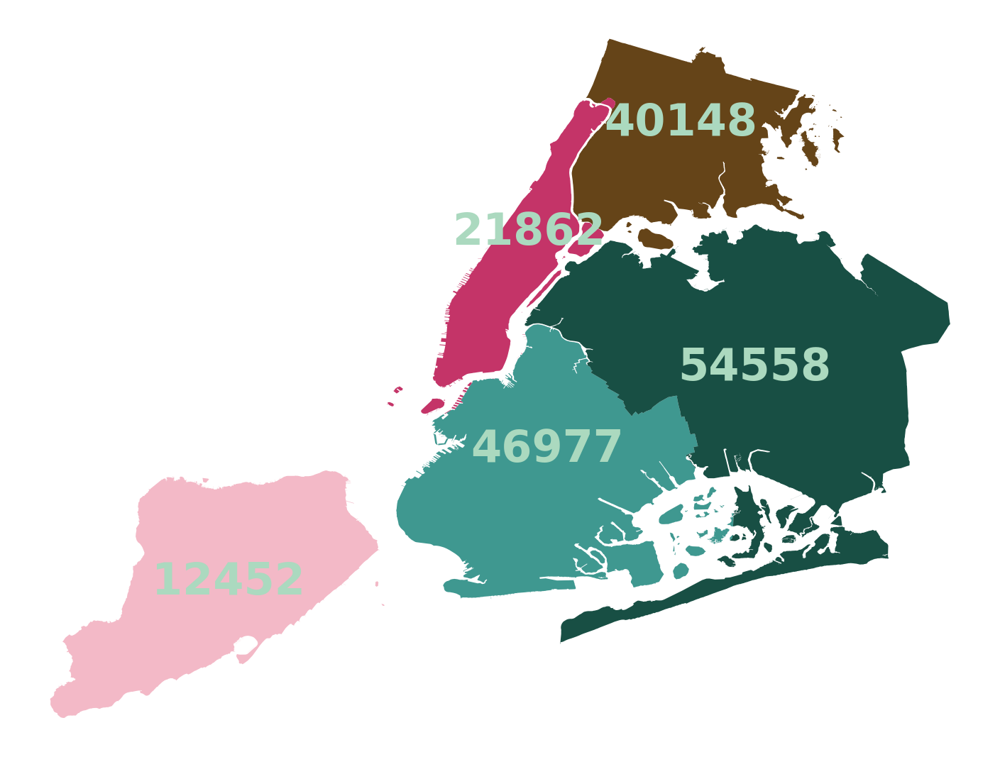

In [51]:
df_nyc['coords'] = df_nyc['geometry'].apply(lambda x: x.representative_point().coords[:])
df_nyc['coords'] = [coords[0] for coords in df_nyc['coords']]

viridis = cm.get_cmap('BrBG', 256)
newcolors = viridis(np.linspace(0, 1, 256))
pink = np.array([191/256, 31/256, 88/256, 1])
coral = np.array([243/256, 179/256, 194/256, 1])
brown = np.array([85/256, 48/256, 0/256, 1])
newcolors[:25, :] = coral #staten island
newcolors[25:115, :] = pink #manhattan
newcolors[115:170, :] = brown #bronx
county_cmap = ListedColormap(newcolors)

fig, ax = plt.subplots(figsize = (25,25)) 
df_nyc.plot(ax = ax, column='April 23', cmap = county_cmap, legend=False, alpha = .9, zorder=1, legend_kwds={"frameon": False, "title": "County Names", "loc":"upper left", "title_fontsize":10, "mode":None,"labelspacing":2,"borderpad":2, "prop":{"family":"Corbel", "size":14}});

for idx, row in df_nyc.iterrows():
    plt.annotate(s=row['April 23'], xy=row['coords'],color = '#abd9bf',
                 horizontalalignment='center', fontsize=62, family = 'DejaVu Sans',fontweight='bold')
ax.axis('off')
plt.savefig("NYC_Covid-19_Cases_today",transparent=True, figsize=(7,7), dpi = 60)